### About
### Develop a technology for detecting mining sites using images from the optical satellite Sentinel-2. Specifically, it involves classifying images that contain mining sites and those that do not.

### Import necessary library and packages

In [1]:
!pip install imagededup distance -qq

In [2]:
import pandas as pd #dataframe manipulation
import numpy as np  #for numerical process
import seaborn as sns #for visualization
from matplotlib import pyplot as plt #for visualization
from PIL import Image, ImageDraw, ImageEnhance,ImageStat #for read the image
import skimage.color 
import skimage.io as skio
from skimage.transform import resize
import skimage.util
from skimage.measure import shannon_entropy, blur_effect
import imagehash #for calculation hash value of image
import cv2 #for read the image
import re
import os
import itertools
import os
import distance
import time
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
from tqdm import tqdm_notebook,tqdm
from IPython.display import display, HTML
import tifffile
import rasterio
import torch
import shutil
from tqdm import tqdm_notebook
from PIL import Image, ImageDraw #for read the image
import skimage.color 
import skimage.util
import imagehash #for calculation hash value of image
import cv2 #for read the image
import os
import re
import itertools
#import distance
import time
import warnings
warnings.filterwarnings("ignore")
from sklearn.neighbors import KNeighborsClassifier
from torchvision import transforms
from multiprocessing import Pool
import torch.nn.functional as F
import imagededup
from imagededup.methods import PHash

phasher = PHash()

Downloading: "https://download.pytorch.org/models/mobilenet_v3_small-047dcff4.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v3_small-047dcff4.pth
100%|██████████| 9.83M/9.83M [00:00<00:00, 81.5MB/s]


### About Data
#### The images are from the optical satellite Sentinel-2.
#### The Sentinel-2 image contains information on following 12 bands:

#### B1: Aerosols

#### B2: Blue

#### B3: Green

#### B4: Red

#### B5: Red Edge 1

#### B6: Red Edge 2

#### B7: Red Edge 3

#### B8: NIR

#### B8A: Red Edge 4

#### B9: Water vapor

#### B11: SWIR 1

### B12: SWIR 2

### [Data Source](https://developers.google.com/earth-engine/datasets/catalog/COPERNICUS_S2_SR_HARMONIZED#description)
### [Data Source](https://solafune.com/competitions/58406cd6-c3bb-4f7a-85c7-c5a1ad67ca03?menu=about&tab=)

### Import data

In [3]:
train=pd.read_csv("/kaggle/input/solafune-finding-mining-sites/train/answer.csv")
test=pd.read_csv("/kaggle/input/solafune-finding-mining-sites/uploadsample.csv")
train_image_path="/kaggle/input/solafune-finding-mining-sites/train/train/"

### Train and test data summary

In [4]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1241 entries, 0 to 1240
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   train_0.tif  1241 non-null   object
 1   0            1241 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 19.5+ KB


#### Train dataset has 1241 images

In [5]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1242 entries, 0 to 1241
Data columns (total 2 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   evaluation_0.tif  1242 non-null   object
 1   0                 1242 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 19.5+ KB


### Test dataset has 1242 images

### Rename the columns

In [6]:
train=train.rename(columns={'train_0.tif':'filename'})
train=train.rename(columns={'0':'label'})

### Target label

In [7]:
label_map={0: 'non_mining_site',
        1: 'mining_site'}
train['label']=train['label'].map(label_map)

### Let's examine the distribution of target labels

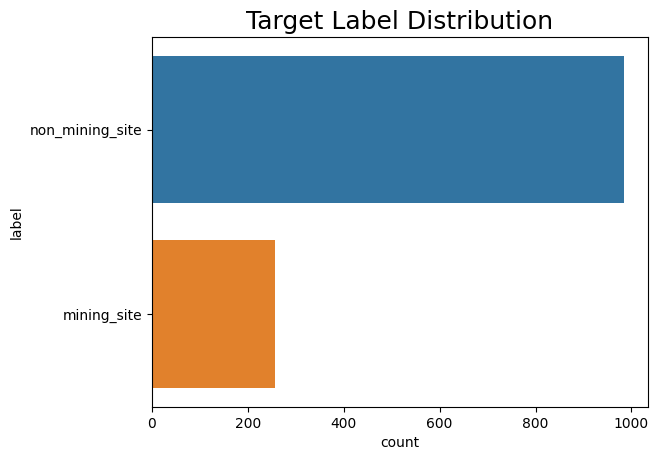

In [8]:
_=sns.countplot(y=train['label'],order=train['label'].value_counts().index);
_=plt.title("Target Label Distribution",fontsize=18)

In [9]:
train['label'].value_counts()

label
non_mining_site    985
mining_site        256
Name: count, dtype: int64

#### The above plot and summary explain that there is an imbalance between the classes.

### Sample images of mining and non-mining site

### Band dictionary

In [10]:
bands={'B1_Aerosols':0,'B2_Blue':1,'B3_Green':2,'B4_Red':3,
'B5_Red_Edge_1':4,'B6_Red_Edge_2':5,'B7_Red_Edge_3':6,
'B8_NIR':7,'B8A_Red_Edge_4':8,'B9_Water_vapor':9,'B11_SWIR_1':10,
'B12_SWIR_2':11}

### Band colors

In [11]:
color_list = {
    'B1_Aerosols': 'Blues',
    'B2_Blue': 'Blues',
    'B3_Green': 'Greens',
    'B4_Red': 'Reds',
    'B5_Red_Edge_1': 'Oranges',
    'B6_Red_Edge_2': 'Oranges',
    'B7_Red_Edge_3': 'Oranges',
    'B8_NIR': 'YlGnBu',
    'B8A_Red_Edge_4': 'Oranges',
    'B9_Water_vapor': 'Blues',
    'B11_SWIR_1': 'gray',
    'B12_SWIR_2': 'gray'}
bandclr=list(color_list.values())

In [12]:
def get_key_from_value(dictionary, target_value):
    for key, value in dictionary.items():
        if value == target_value:
            return key
    return None

In [13]:
def plot_sample_image(path,filename,figure_size=(10,15)):
    fig=plt.figure(figsize=figure_size)
    img=tifffile.imread(f"{path}{filename}")
    for i,(band,clr) in enumerate(zip(bands.values(),bandclr)):
        ax=plt.subplot(4,3,i+1)
        ax.imshow(img[:,:,band],aspect='auto',cmap=clr)
        ax.set_title(f"{get_key_from_value(bands, band)}",fontsize=15)
        ax.axis("off")
        ax.set_aspect('auto')
    #plt.tight_layout()
    plt.show()

### Sample mining site image and 12 bands

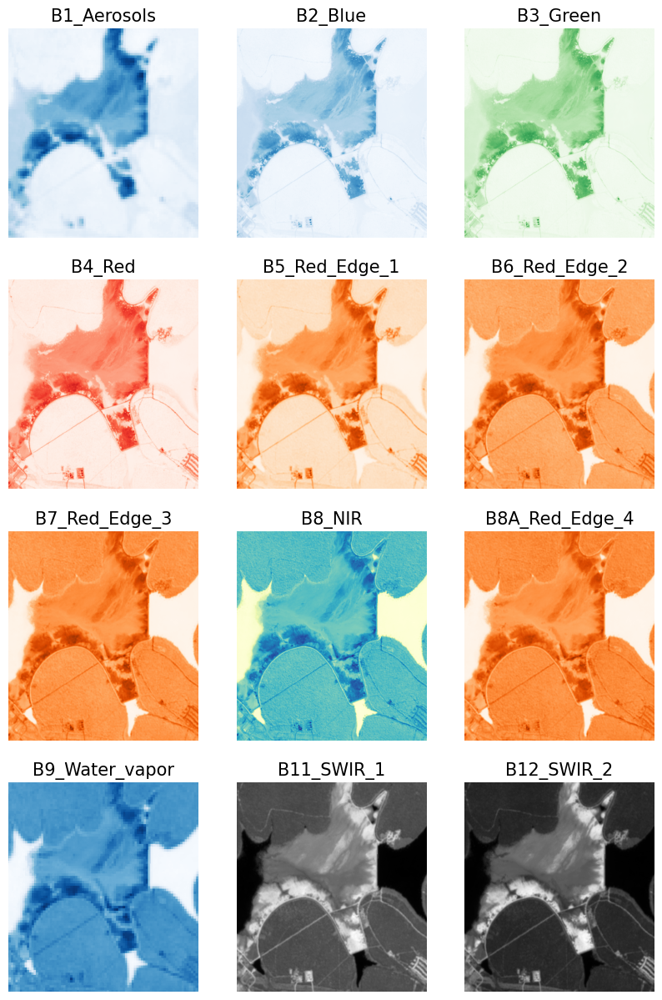

In [14]:
plot_sample_image(train_image_path,'train_3.tif',figure_size=(10,15))

### Sample non-mining site image and 12 bands

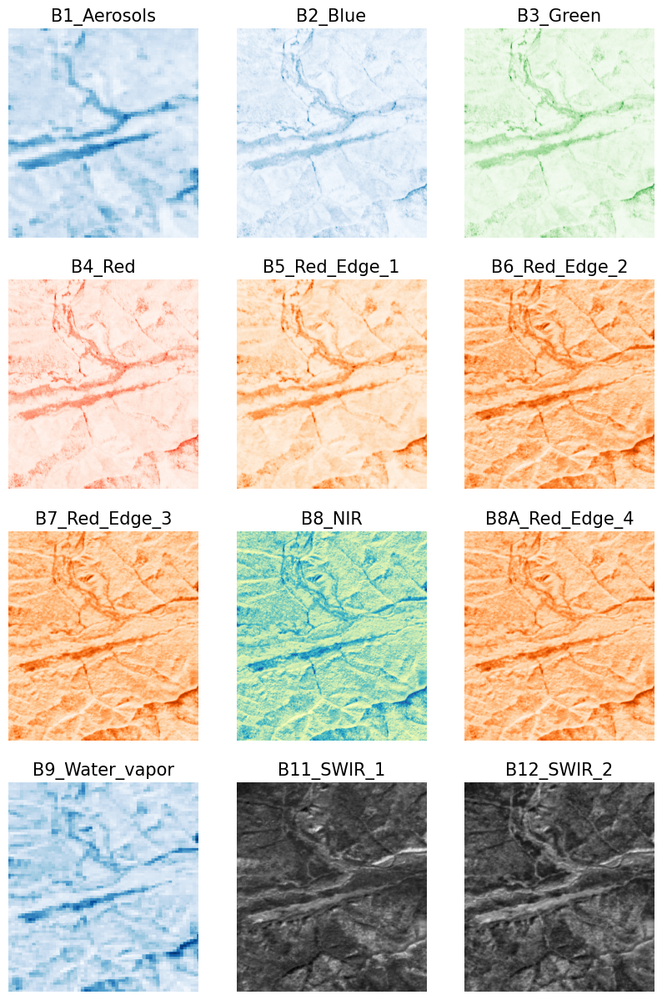

In [15]:
plot_sample_image(train_image_path,'train_5.tif',figure_size=(10,15))

### Extract 1D array from each bands

In [16]:
def get_band_1d(df,path):
    b1,b2,b3,b4,b5,b6,b7,b8,b8a,b9,b11,b12=([] for i in range(12))
    for file in tqdm_notebook(df['filename']):
        img=tifffile.imread(f"{path}{file}")
        img=resize(img, (64, 64), anti_aliasing=True)
        for band,lists in zip(range(12),[b1,b2,b3,b4,b5,b6,b7,b8,b8a,b9,b11,b12]):
            lists.append(list(img[:,:,band].flatten()))
    return {f"b{key}":lists  for key ,lists in zip(range(1,13), [b1,b2,b3,b4,b5,b6,b7,b8,b8a,b9,b11,b12])}
  

In [17]:
channel_1d_data=get_band_1d(train,train_image_path)

  0%|          | 0/1241 [00:00<?, ?it/s]

### Let's visualize the histogram of 12 bands for mining site images.

In [18]:
def show_histogram(data,figure_size=(15,10),mining=True):
    fig=plt.figure(figsize=figure_size)
    custom_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b',
                 '#e377c2', '#7f7f7f', '#bcbd22', '#17becf', '#ff00ff', '#00ff00']
 
        
    for i,(band,bandname,clr) in enumerate(zip(range(1,13),list(bands.keys()),custom_colors)):
        _=plt.subplot(4,3,i+1)
        if mining:
            data=np.concatenate(np.array(channel_1d_data[f"b{band}"])[train[train['label']=='mining_site'].index])
        else:
            data=np.concatenate(np.array(channel_1d_data[f"b{band}"])[train[train['label']=='non_mining_site'].index])
        sns.histplot(data,color=clr)
        plt.title(f"{bandname}",fontsize=15)
        del data
    plt.tight_layout()
    plt.show()

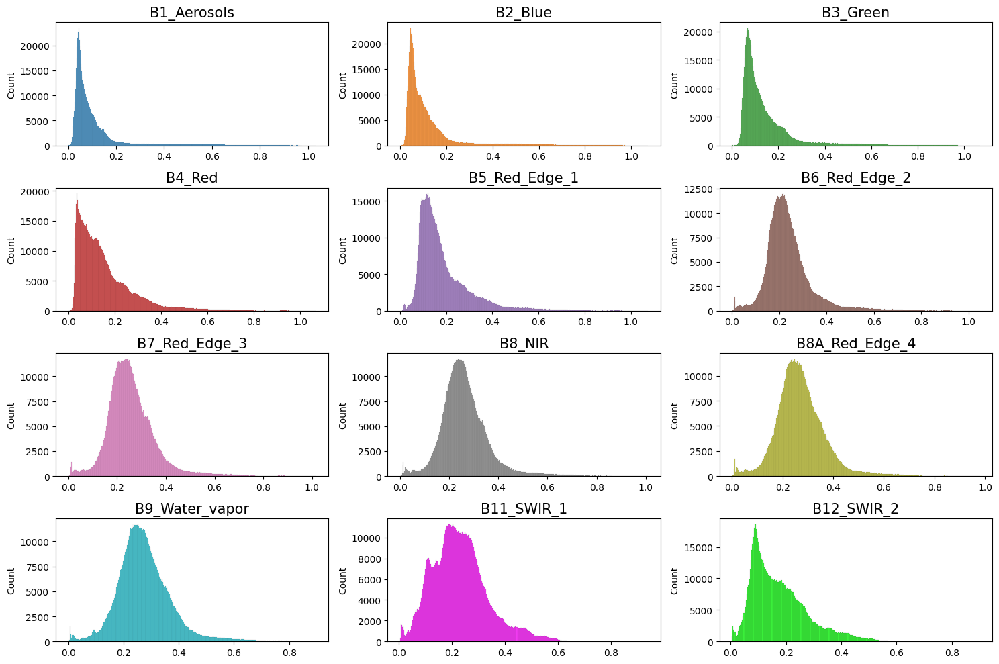

In [19]:
show_histogram(channel_1d_data)

### Let's visualize the histogram of 12 bands for non-mining site images.

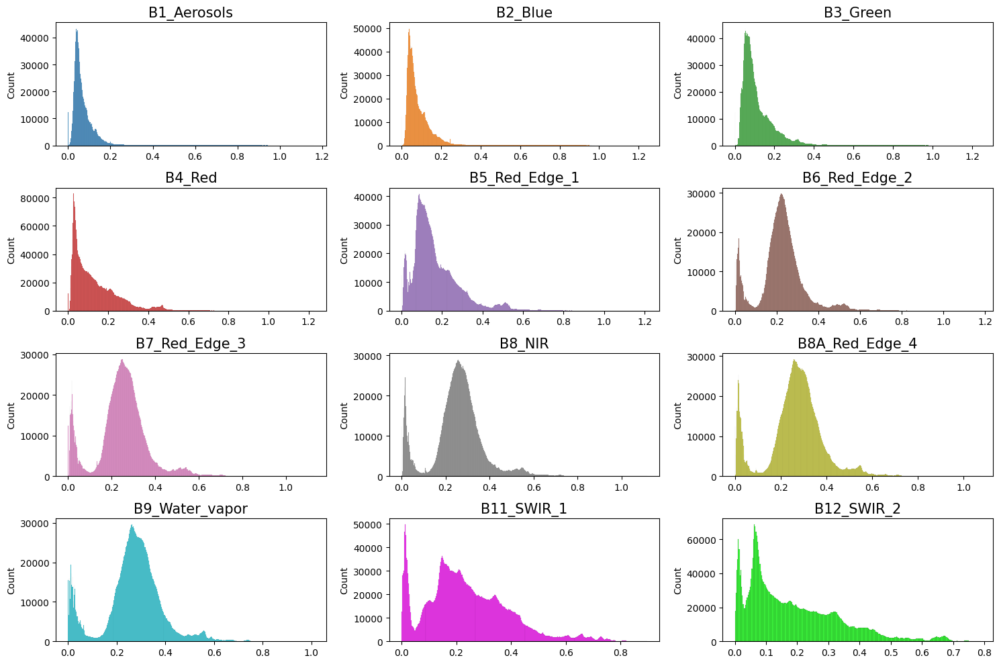

In [20]:
show_histogram(channel_1d_data,mining=False)

### Popular RGB Composites

In [21]:
band_combo={'Natural Colors':[bands['B4_Red'],bands['B3_Green'],bands['B2_Blue']],
'False color Infrared':[bands['B8_NIR'],bands['B4_Red'],bands['B3_Green']],
'False color Urban':[bands['B12_SWIR_2'],bands['B11_SWIR_1'],bands['B4_Red']],
'Agriculture':[bands['B11_SWIR_1'],bands['B8_NIR'],bands['B12_SWIR_2']],
'Atmospheric penetration':[bands['B12_SWIR_2'],bands['B11_SWIR_1'],bands['B8A_Red_Edge_4']],
'Healthy vegetation':[bands['B8_NIR'],bands['B11_SWIR_1'],bands['B12_SWIR_2']],
'Land/Water':[bands['B8_NIR'],bands['B11_SWIR_1'],bands['B4_Red']],
'Natural Colors with Atmospheric Removal':[bands['B12_SWIR_2'],bands['B8_NIR'],bands['B3_Green']],
'Shortwave Infrared':[bands['B12_SWIR_2'],bands['B8_NIR'],bands['B4_Red']],
'Vegetation Analysis':[bands['B11_SWIR_1'],bands['B8_NIR'],bands['B4_Red']]}


composites_color_maps = {
    'Natural Colors': 'viridis',
    'False color Infrared': 'YlGnBu',
    'False color Urban': 'Oranges',
    'Agriculture': 'YlOrBr',
    'Atmospheric Penetration': 'Blues',
    'Healthy Vegetation': 'Greens',
    'Land/Water': 'coolwarm',
    'Natural Colors with Atmospheric Removal': 'plasma',
    'Shortwave Infrared': 'bone',
    'Vegetation Analysis': 'Greens',
}

In [22]:
 def plot_rgb_composites(path,filename,figure_size=(15,10)):
    fig=plt.figure(figsize=figure_size)
    img=tifffile.imread(f"{path}{filename}")
    for i,(band,clr) in enumerate(zip(band_combo.keys(),list(composites_color_maps.values()))):
        ax=plt.subplot(5,2,i+1)
        cols=[band_combo[band][0],band_combo[band][1],band_combo[band][2]]
   
        ax.imshow(np.dstack((img[:,:,cols[0]],
                          img[:,:,cols[1]],
                          img[:,:,cols[2]])),aspect='auto',cmap=clr)

       
        ax.set_title(f"{get_key_from_value(composites_color_maps, clr)}",fontsize=15)
        ax.axis("off")
       # ax.set_aspect('auto')
    #plt.tight_layout()
    plt.show()

### Let's visualize popular rgb composites for mining site image.

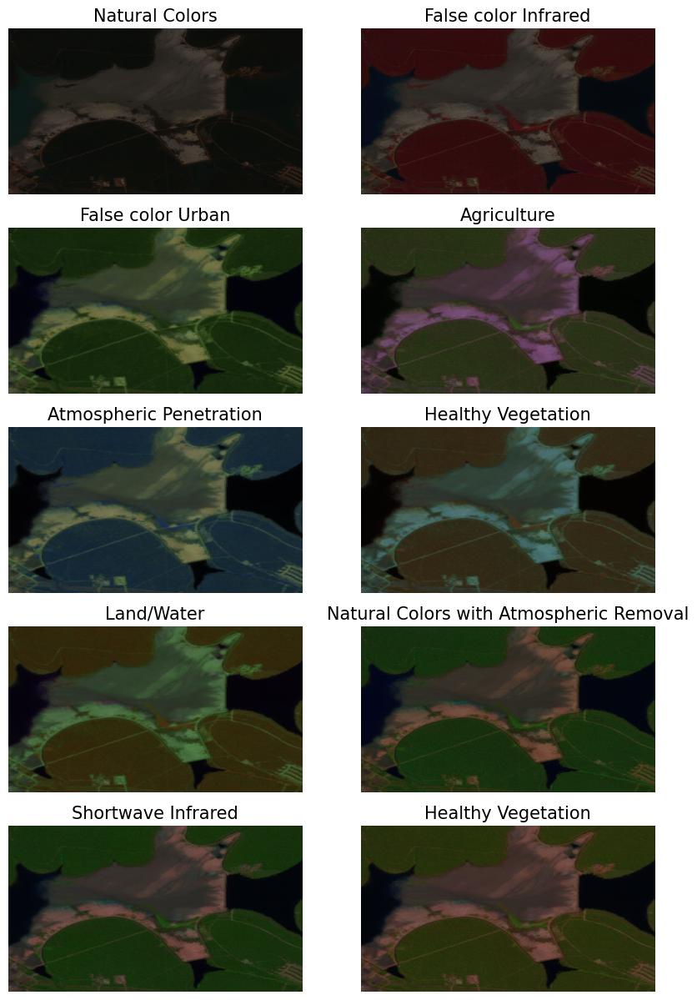

In [23]:
plot_rgb_composites(train_image_path,'train_3.tif',figure_size=(10,15))

### Let's visualize popular rgb composites for non-mining site image.

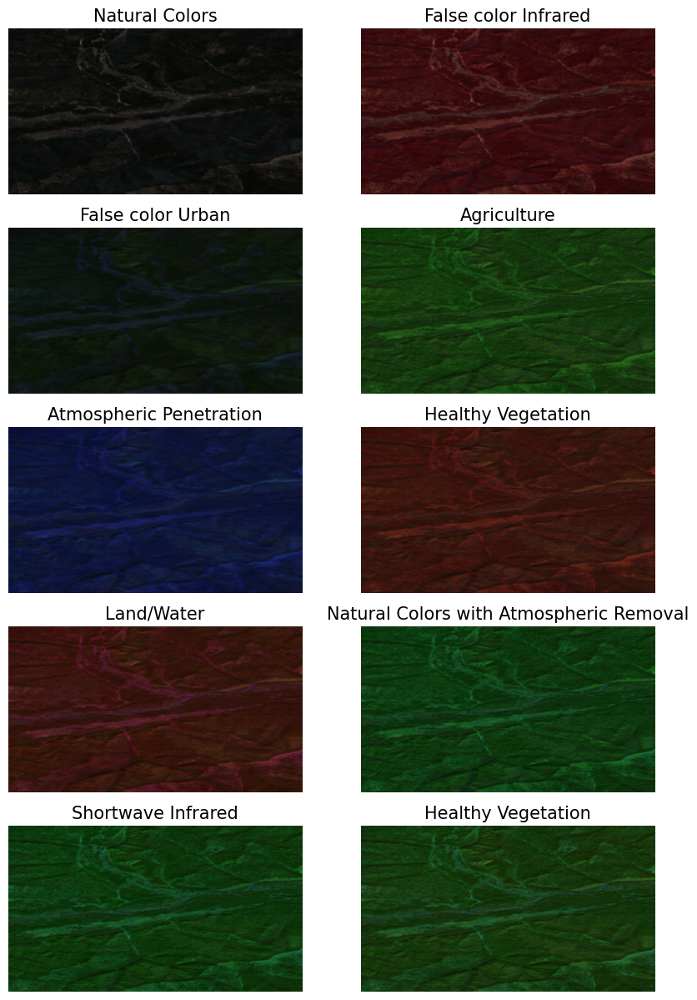

In [24]:
plot_rgb_composites(train_image_path,'train_5.tif',figure_size=(10,15))

### Let's visualize some remote sensing indices for mining and non-mining site image.

In [25]:
def ndvi(image):
    #Normalized Difference Vegetation Index (NDVI) is a widely used vegetation index in remote sensing.
    #NDVI= NIR-Red/NIR+Red
    #image = np.expand_dims(image, axis=-1)
    ndvi_denominator = image[:,:,bands['B3_Green']]+image[:,:,bands['B8_NIR']]
    
    ndvi = (image[:,:,bands['B3_Green']]-image[:,:,bands['B8_NIR']]) / ndvi_denominator
    return ndvi
    
def ndwi(image):
    #Normalized Difference Water Index (NDWI) is a spectral index commonly used to detect and monitor
    #water bodies in remote sensing imagery.
    #NDVI= NIR-Red/NIR+Red
    #image = np.expand_dims(image, axis=-1)
    ndwi_denominator =image[:,:,bands['B8_NIR']]+image[:,:,bands['B4_Red']]
    ndwi=(image[:,:,bands['B8_NIR']]-image[:,:,bands['B4_Red']])/ndwi_denominator
    return ndwi

def fmi(image):
    #Ferrous Mineral Index (FMI) is an indicator for iron-bearing minerals
    #FMI = Band11/
    #image = np.expand_dims(image, axis=-1)
    denominator=image[:,:,bands['B8A_Red_Edge_4']]
    fmi=image[:,:,bands['B11_SWIR_1']]/denominator#Ferrous Mineral Index-FMI
    return fmi
def msi(image):
    #Moisture Stress Index (MSI) is a vegetation index used to assess vegetation water stress based on remotely sensed data
    #MSI = B11 / B08
    #image = np.expand_dims(image, axis=-1)
    numerator = image[:,:,bands['B11_SWIR_1']]
    denominator = image[:,:,bands['B8_NIR']]
    msi =  numerator / denominator
    return msi

def bsi(image):
    #Bare Soil Index (BSI) is a spectral index commonly used for mapping bare soil or distinguishing between bare soil and vegetation
    #BSI= (SWIR+NIR)/(SWIR−NIR)
    #image = np.expand_dims(image, axis=-1)
    numerator = image[:,:,bands['B11_SWIR_1']] - image[:,:,bands['B8_NIR']]
    denominator = image[:,:,bands['B11_SWIR_1']] + image[:,:,bands['B8_NIR']]
    bsi = numerator / denominator
    return bsi

def nbr(image):
    #Normalized Burn Ratio (NBR) is a spectral index commonly used to assess and monitor burned areas, especially after wildfires.
    #NBR= (NIR+SWIR)/(NIR−SWIR)
   # image = np.expand_dims(image, axis=-1)
    numerator = image[:,:,bands['B8_NIR']] - image[:,:,bands['B12_SWIR_2']]
    denominator = image[:,:,bands['B8_NIR']] + image[:,:,bands['B12_SWIR_2']]
    nbr =  numerator / denominator
    return nbr

In [26]:
def plot_side_by_side(ms,nms):
    fig, axs = plt.subplots(1, 2 ,figsize=(15,5))
    axs[0].imshow(ms,aspect='auto',)
    axs[0].axis('off')
    axs[0].set_title("Mining Site",fontsize=18)
    axs[1].imshow(nms,aspect='auto',)
    axs[1].axis('off')
    axs[1].set_title("Non-Mining Site",fontsize=18)

In [27]:
mining_site=tifffile.imread(f"{train_image_path}{'train_3.tif'}")
non_mining_site=tifffile.imread(f"{train_image_path}{'train_5.tif'}")

### Normalized Difference Vegetation Index (NDVI)

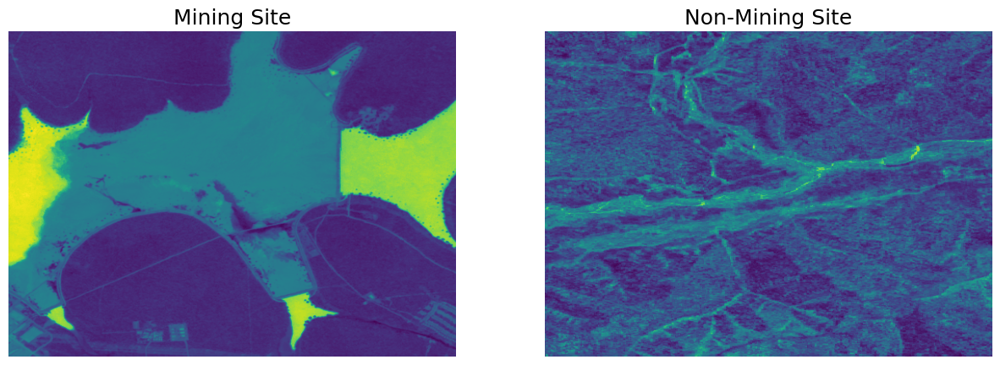

In [28]:
plot_side_by_side(ndvi(mining_site),ndvi(non_mining_site))

### Normalized Difference Water Index (NDWI)

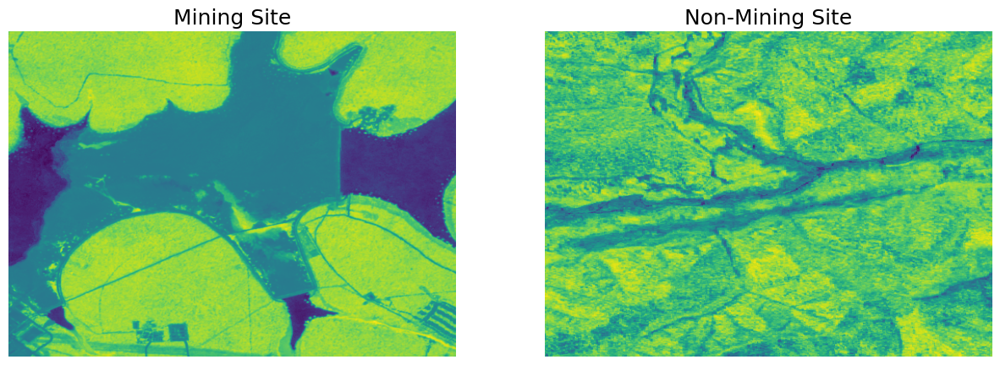

In [29]:
plot_side_by_side(ndwi(mining_site),ndwi(non_mining_site))

### Ferrous Mineral Index (FMI)

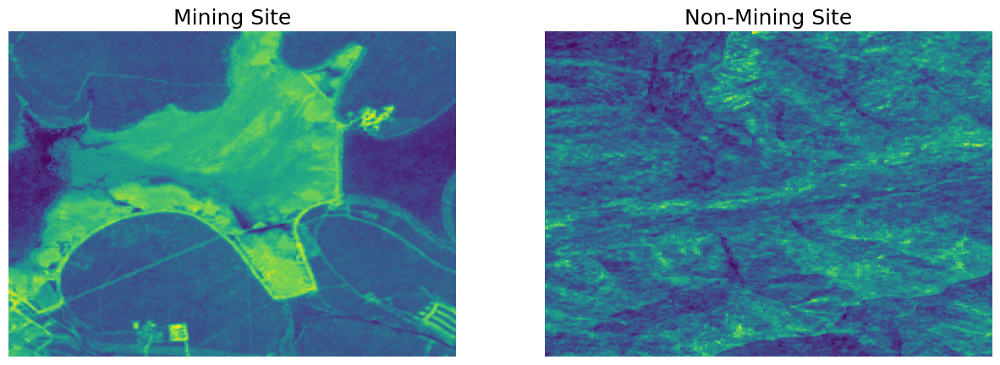

In [30]:
plot_side_by_side(fmi(mining_site),fmi(non_mining_site))

### Moisture Stress Index (MSI)

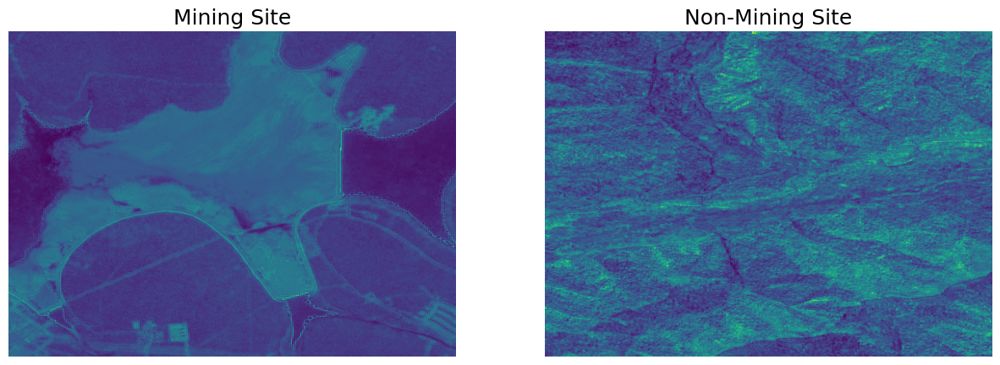

In [31]:
plot_side_by_side(msi(mining_site),msi(non_mining_site))

### Bare Soil Index (BSI)

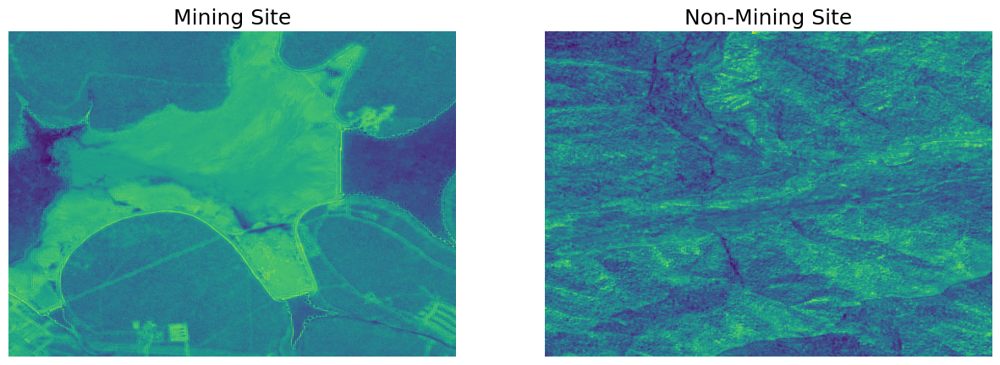

In [32]:
plot_side_by_side(bsi(mining_site),bsi(non_mining_site))

### Normalized Burn Ratio (NBR)

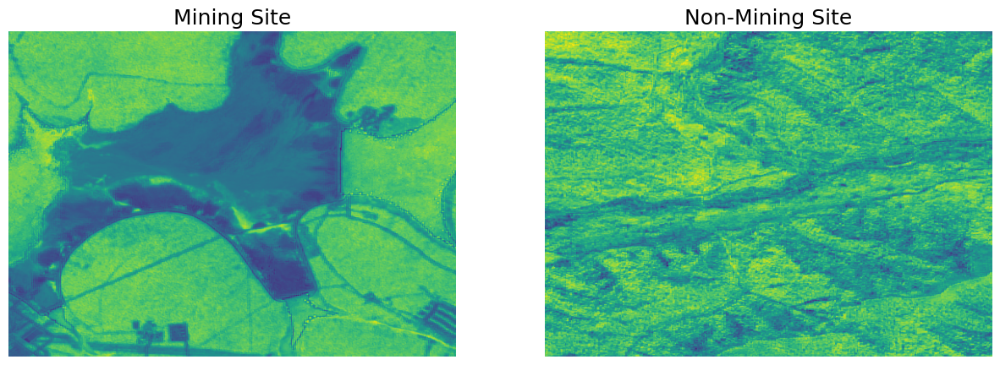

In [33]:
plot_side_by_side(nbr(mining_site),nbr(non_mining_site))

### Let's extract basic level image information

#### Extract rgb channel image and save it in folder

In [34]:
def save_image(df,path,savepath):
    for file in tqdm_notebook(df['filename']):
        img = tifffile.imread(f"{path}{file}")
        img = np.dstack((img[:,:,3],img[:,:,2],img[:,:,1]),)
        img = 255 * (img - img.min()) / (img.max() - img.min())
        img=img.astype(np.uint8)
        pil_img=j=Image.fromarray(img)
        name=file.split(".")[0]
        pil_img.save(f"{savepath}/{name}.jpg")
        del img,pil_img ,name

In [35]:
os.makedirs("/kaggle/working/train")

In [36]:
save_image(train,train_image_path,"/kaggle/working/train")

  0%|          | 0/1241 [00:00<?, ?it/s]

In [37]:
def basic_image_info(df,path):
    image_name=[]
    img_contrast=[]
    entropy=[]
    blur=[]
    for file in tqdm_notebook(df['filename']):
        image_name.append(file)
        file=re.sub(".tif",".jpg",file)
        img=Image.open(f"{(os.path.join(path, file))}")
        image_array = np.array(img)
        grey_img = cv2.cvtColor(image_array, cv2.COLOR_BGR2GRAY)
        img_contrast.append(grey_img.std()) # image contrast 
        
        
        #low entropy - fewer pixels, medium entropy - mixed structure and randomness, high entropy - more complex structure and randomness
        entropy.append(shannon_entropy(image_array)) 
        #0 - no blur, 1 - maximum blur
        blur.append(blur_effect(np.array(img.convert('L'))))


    return pd.DataFrame({'image_name':image_name,
                         'img_contrast':img_contrast,
                          'entropy':entropy,
                         'blur':blur
                          
                        })

In [38]:
train_image_basic_info=basic_image_info(train,'/kaggle/working/train/')

  0%|          | 0/1241 [00:00<?, ?it/s]

In [39]:
train_image_basic_info['label']=train['label']

### Let's explore the distribution of image contrast, entropy, and blur based on target.

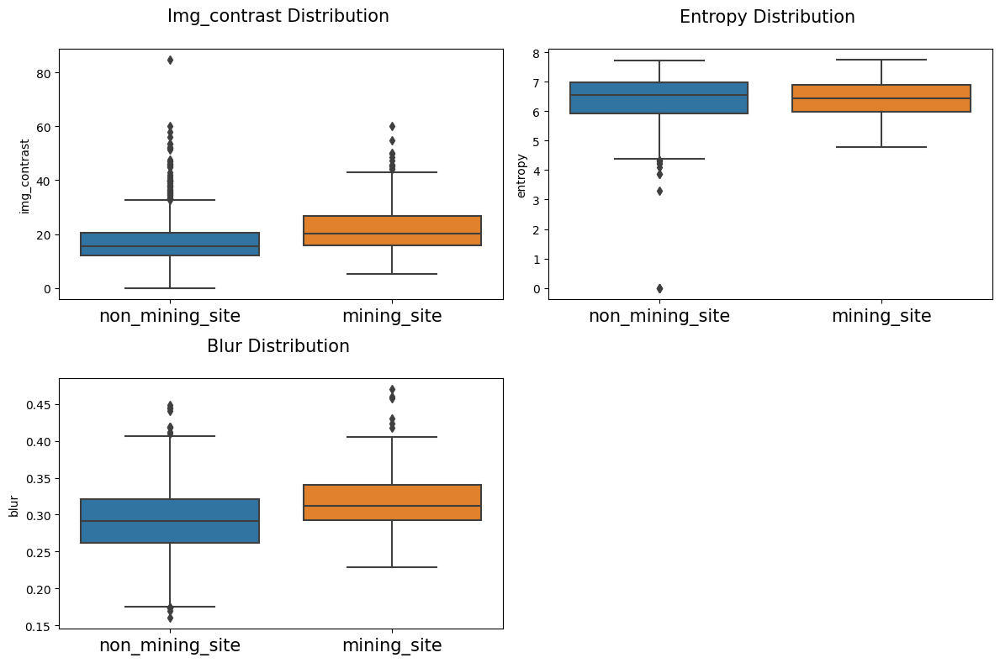

In [40]:
fig=plt.subplots(figsize=(12, 8))
for i,col  in enumerate(['img_contrast','entropy', 'blur']):    
    _=plt.subplot(2,2,i+1,)
    sns.boxplot(data=train_image_basic_info,
                     x='label',y=col)
    _=plt.title(f"{col.capitalize()} Distribution \n",fontsize=15)
    _=plt.xlabel("")
    _=plt.xticks(fontsize=15)
    _=plt.tight_layout()
plt.show()

In [41]:
def show_image(imagelist,path,figure_size=(10,10)):
    fig=plt.figure(figsize=figure_size)
    for i,file in enumerate(imagelist):
        ax=plt.subplot(len(imagelist),2,i+1)
        file=re.sub(".tif",".jpg",file)
        img=Image.open(f"{path}{file}")
        img=img.resize((224,224))   
        ax.imshow(img,aspect='auto')
        ax.set_title(f"{file}",fontsize=8)
        ax.axis("off")
        #ax.set_aspect('auto')
    #plt.tight_layout()
    #plt.show()

### Let's view images with low entropy.

In [42]:
train_image_basic_info[train_image_basic_info['entropy']<4]

,image_name,img_contrast,entropy,blur,label
371,train_372.tif,9.301380,3.863331,0.343801,non_mining_site
450,train_451.tif,5.440930,3.307914,0.276764,non_mining_site
515,train_516.tif,5.361413,3.878957,0.268492,non_mining_site
717,train_718.tif,0.000000,0.000000,NaN,non_mining_site
787,train_788.tif,0.000000,0.000000,NaN,non_mining_site
957,train_958.tif,0.000000,0.000000,NaN,non_mining_site


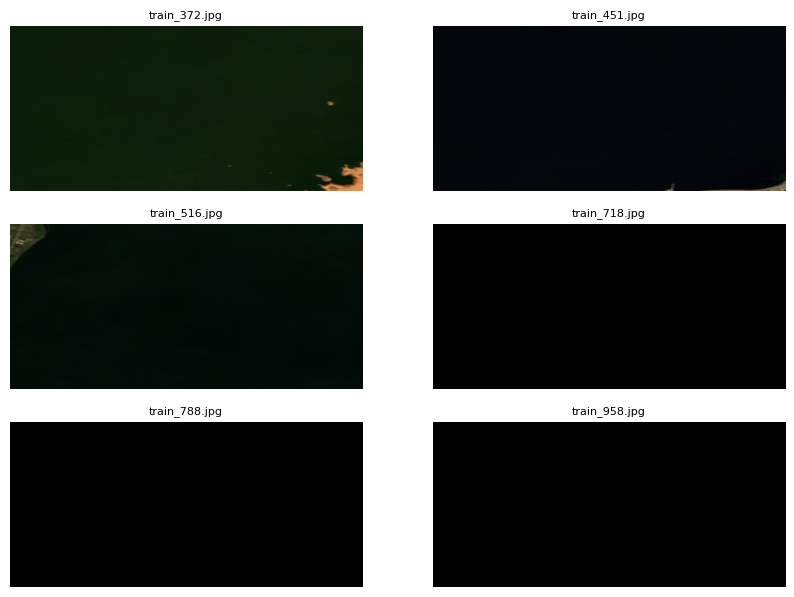

In [43]:
show_image(train_image_basic_info[train_image_basic_info['entropy']<4]['image_name'].values,
          "/kaggle/working/train/",figure_size=(10,15))

#### There are 6 images with low entropy.

### Let's visualize the 12 bands for low entropy images.

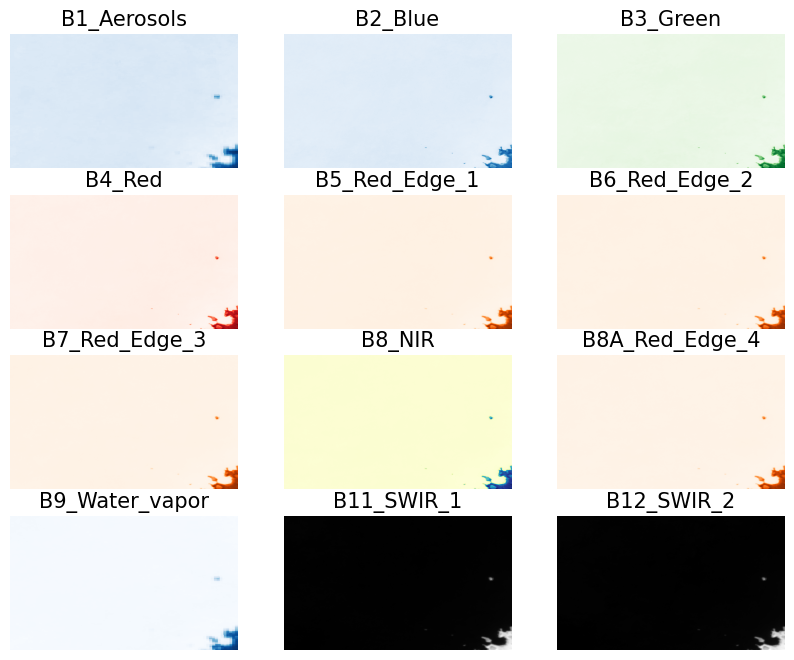

In [44]:
plot_sample_image(train_image_path,'train_372.tif',figure_size=(10,8))

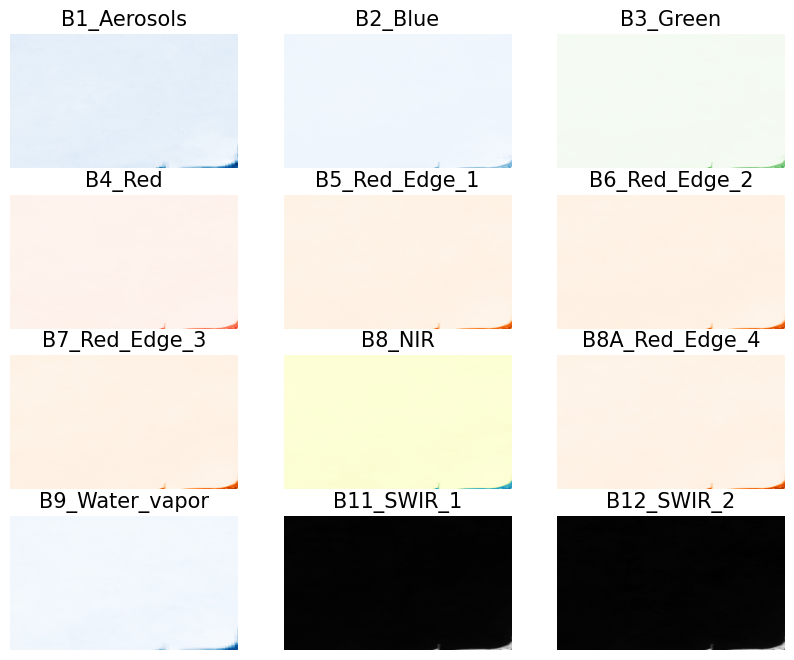

In [45]:
plot_sample_image(train_image_path,'train_451.tif',figure_size=(10,8))

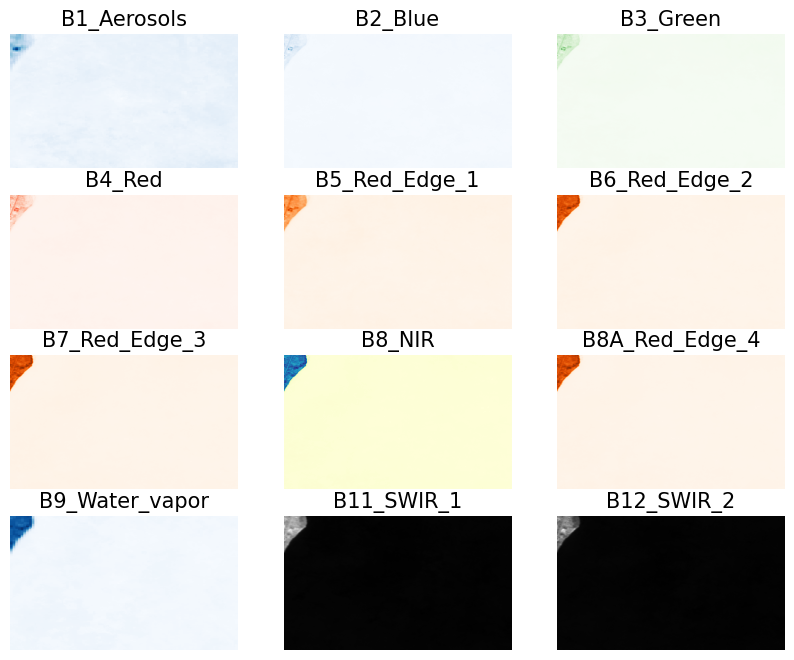

In [46]:
plot_sample_image(train_image_path,'train_516.tif',figure_size=(10,8))

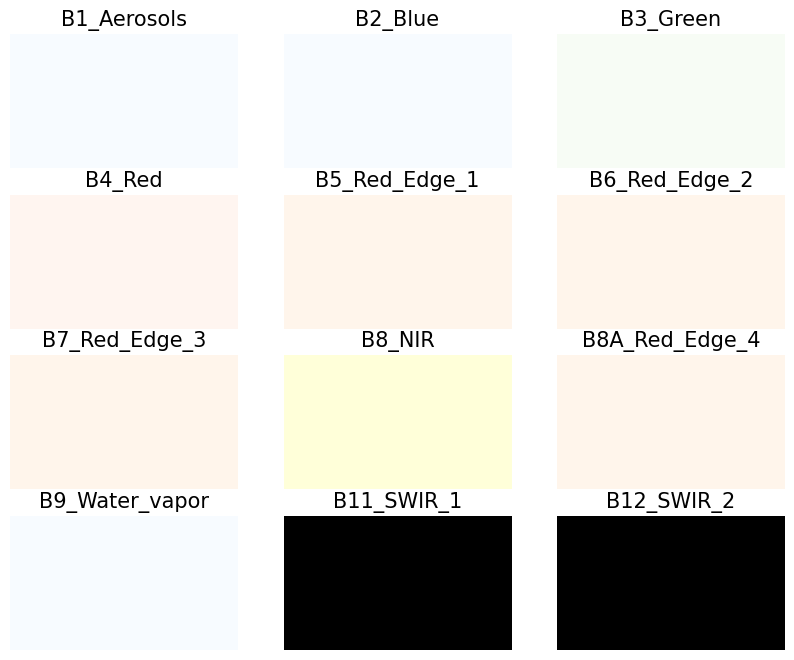

In [47]:
plot_sample_image(train_image_path,'train_718.tif',figure_size=(10,8))

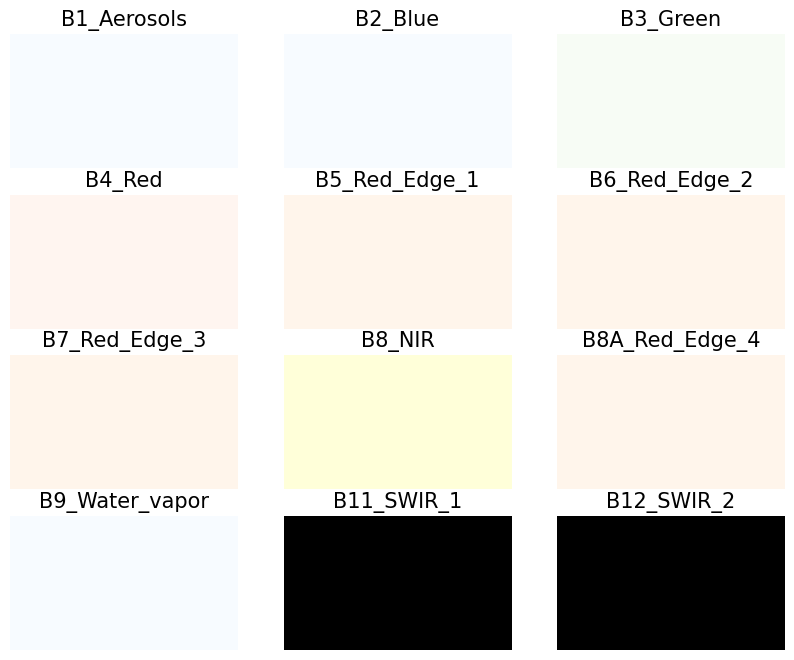

In [48]:
plot_sample_image(train_image_path,'train_788.tif',figure_size=(10,8))

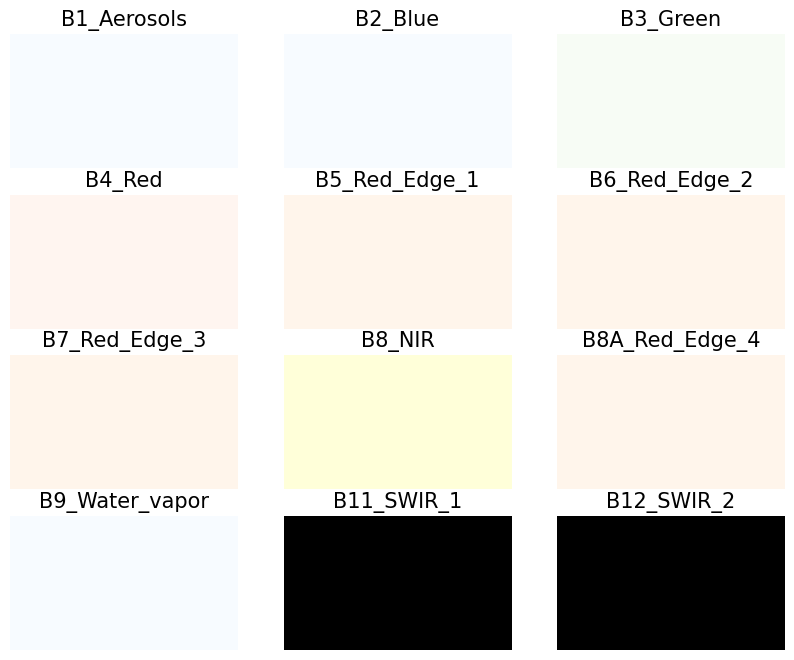

In [49]:
plot_sample_image(train_image_path,'train_958.tif',figure_size=(10,8))

### Let's find duplicate images using imagededup

In [50]:
#Find duplicates using Perceptual hashing
from imagededup.methods import PHash

phasher = PHash()
duplicates = phasher.find_duplicates(image_dir="/kaggle/working/train", scores=True)

2024-04-22 14:42:32,558: INFO Start: Calculating hashes...
100%|██████████| 1241/1241 [00:03<00:00, 379.55it/s]
2024-04-22 14:42:36,279: INFO End: Calculating hashes!
2024-04-22 14:42:36,281: INFO Start: Evaluating hamming distances for getting duplicates
2024-04-22 14:42:36,283: INFO Start: Retrieving duplicates using Cython Brute force algorithm
100%|██████████| 1241/1241 [00:00<00:00, 2042.91it/s]
2024-04-22 14:42:37,280: INFO End: Retrieving duplicates using Cython Brute force algorithm
2024-04-22 14:42:37,281: INFO End: Evaluating hamming distances for getting duplicates


In [51]:
{img:dup for img,dup in duplicates.items() if len(dup)>0}

{'train_984.jpg': [('train_596.jpg', 10)],
 'train_958.jpg': [('train_788.jpg', 0), ('train_718.jpg', 0)],
 'train_372.jpg': [('train_329.jpg', 2),
  ('train_451.jpg', 4),
  ('train_925.jpg', 6)],
 'train_515.jpg': [('train_302.jpg', 10)],
 'train_925.jpg': [('train_372.jpg', 6),
  ('train_329.jpg', 8),
  ('train_451.jpg', 8)],
 'train_788.jpg': [('train_958.jpg', 0), ('train_718.jpg', 0)],
 'train_1003.jpg': [('train_552.jpg', 4)],
 'train_329.jpg': [('train_372.jpg', 2),
  ('train_451.jpg', 2),
  ('train_925.jpg', 8)],
 'train_1064.jpg': [('train_904.jpg', 2)],
 'train_596.jpg': [('train_984.jpg', 10)],
 'train_451.jpg': [('train_329.jpg', 2),
  ('train_372.jpg', 4),
  ('train_925.jpg', 8)],
 'train_302.jpg': [('train_515.jpg', 10)],
 'train_904.jpg': [('train_1064.jpg', 2)],
 'train_552.jpg': [('train_1003.jpg', 4)],
 'train_718.jpg': [('train_958.jpg', 0), ('train_788.jpg', 0)]}

In [52]:
def img_read(path,im ,new_size=False):
    img = Image.open(f"{(os.path.join(path, im))}")
    #img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    if new_size:
        img=img.resize((224,224))   
    return img

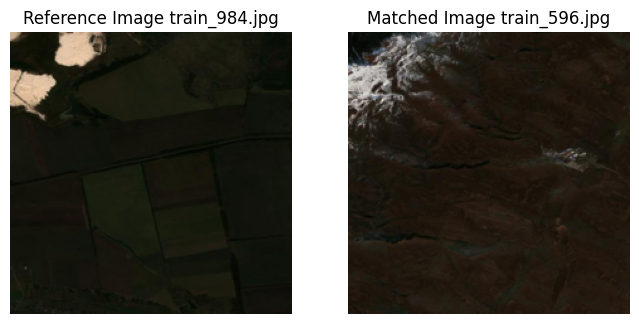

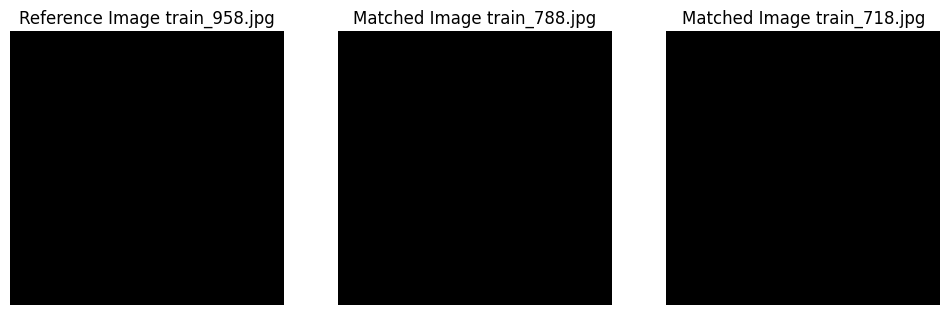

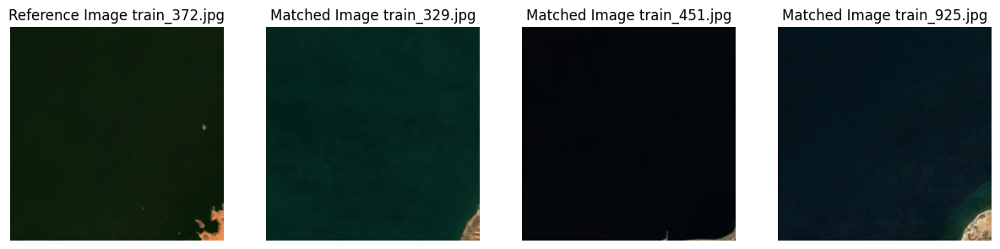

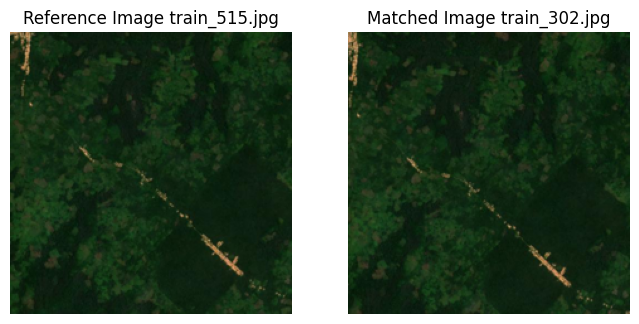

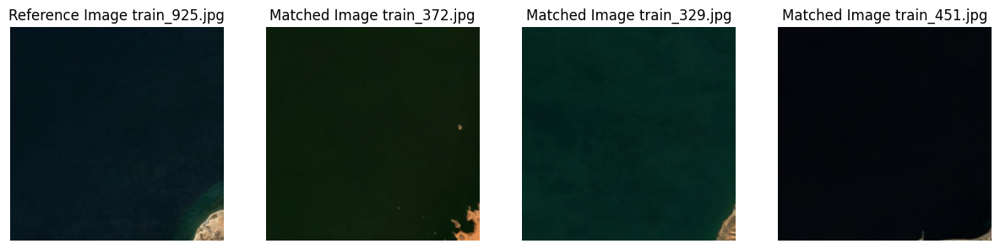

...

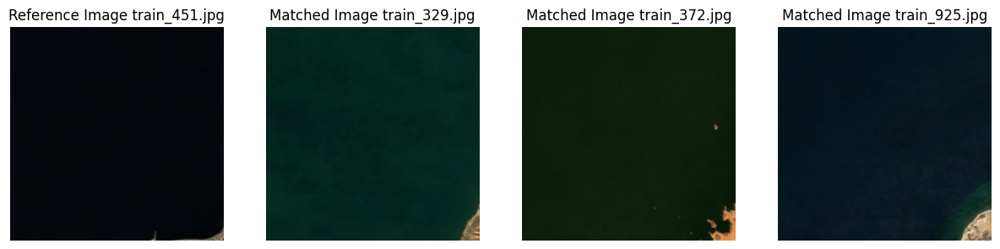

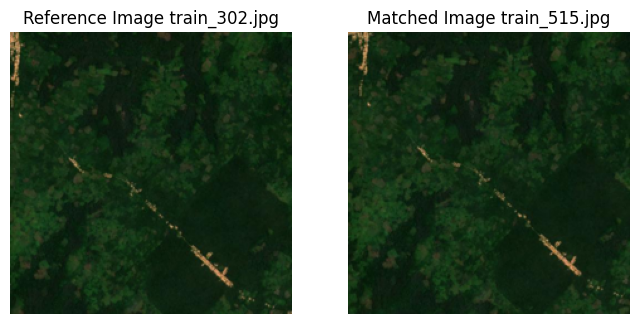

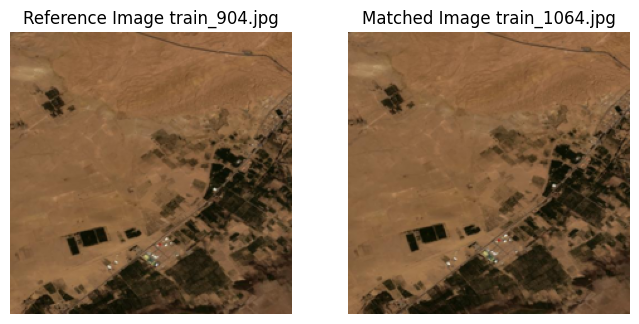

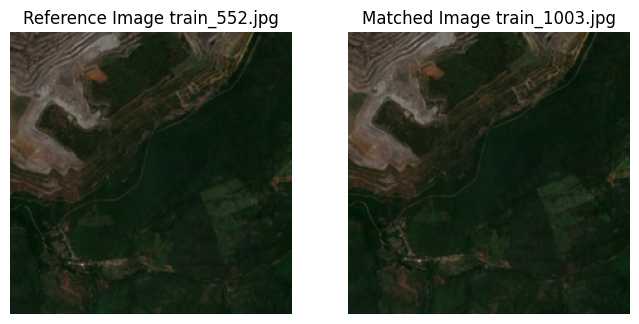

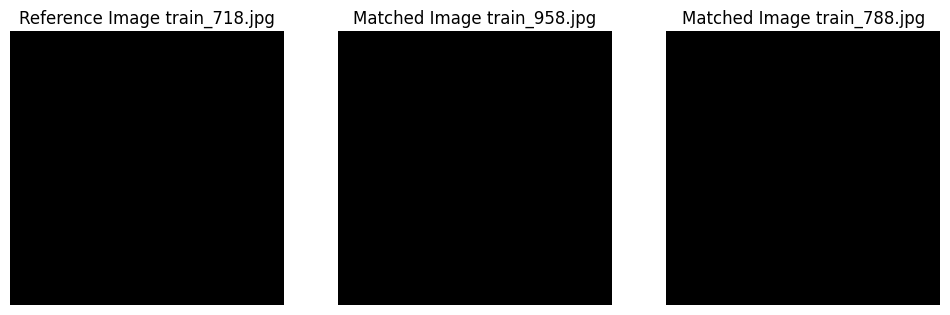

In [53]:
for img ,dup in {img:dup for img,dup in duplicates.items() if len(dup)>0}.items():
    if len(dup)==1:
        for imgs,score in dup:
            fig, axs = plt.subplots(1, 2 ,figsize=(8, 6))
            axs[0].imshow(img_read('/kaggle/working/train/',img,new_size=True))
            axs[0].axis('off')
            axs[0].set_title(f"Reference Image {img}")
            axs[1].imshow(img_read('/kaggle/working/train/',imgs,new_size=True))
            axs[1].axis('off')
            axs[1].set_title(f"Matched Image {imgs}")
            plt.show()
    elif len(dup)==2:
        fig, axs = plt.subplots(1, 3 ,figsize=(12, 8))
        axs[0].imshow(img_read('/kaggle/working/train/',img,new_size=True))
        axs[0].axis('off')
        axs[0].set_title(f"Reference Image {img}")
        for i,(imgs,score) in zip(range(1,3),dup):
            axs[i].imshow(img_read('/kaggle/working/train/',imgs,new_size=True))
            axs[i].axis('off')
            axs[i].set_title(f"Matched Image {imgs}")
        plt.show()
    elif len(dup)==3:
        fig, axs = plt.subplots(1, 4 ,figsize=(15, 8))
        axs[0].imshow(img_read('/kaggle/working/train/',img,new_size=True))
        axs[0].axis('off')
        axs[0].set_title(f"Reference Image {img}")
        for i,(imgs,score) in zip(range(1,4),dup):
            axs[i].imshow(img_read('/kaggle/working/train/',imgs,new_size=True))
            axs[i].axis('off')
            axs[i].set_title(f"Matched Image {imgs}")
        plt.show()
        

In [54]:
shutil.rmtree("/kaggle/working/train")